In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tqdm.autonotebook import tqdm
from joblib import Parallel, delayed
#import umap
import pandas as pd

/mnt/cube/tsainbur/conda_envs/tpy3/lib/python3.6/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
from avgn.utils.paths import DATA_DIR, most_recent_subdirectory, ensure_dir

In [4]:
DATASET_ID = 'Budka_crex_crex_segmented'

In [5]:
from avgn.utils.hparams import HParams
from avgn.dataset import DataSet

In [6]:
from avgn.signalprocessing.create_spectrogram_dataset import prepare_wav, create_label_df, get_row_audio

### create dataset

In [42]:
hparams = HParams(
    num_mel_bins = 32,
    mel_lower_edge_hertz=1000,
    mel_upper_edge_hertz=10000,
    butter_lowcut = 500,
    butter_highcut = 15000,
    ref_level_db = 20,
    min_level_db = -40,
    mask_spec = True,
    win_length_ms = 5,
    hop_length_ms = 1,
    n_fft=1024,
    nex=-1,
    n_jobs=-1,
    verbosity = 1,
)

In [43]:
# create a dataset object
dataset = DataSet(DATASET_ID, hparams = hparams)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   13.0s


[Parallel(n_jobs=-1)]: Done 184 out of 231 | elapsed:   13.3s remaining:    3.4s
[Parallel(n_jobs=-1)]: Done 231 out of 231 | elapsed:   13.4s finished


In [44]:
dataset.sample_json

OrderedDict([('indvs',
              OrderedDict([('89460',
                            OrderedDict([('syllables',
                                          OrderedDict([('start_times',
                                                        [4.362, 6.162]),
                                                       ('end_times',
                                                        [4.548,
                                                         6.319])]))]))])),
             ('species', 'Crex crex'),
             ('sound_type', 'song'),
             ('age', 'adult'),
             ('sex', 'male'),
             ('latitude', 54.31925),
             ('longitude', 20.23955),
             ('altitude', 121.0),
             ('datetime', '2011-06-30_23-04-00'),
             ('wav_loc',
              '/mnt/cube/tsainbur/Projects/github_repos/avgn_paper/data/processed/Budka_crex_crex/2019-06-23_11-02-14/WAV/Crex_crex_89460_short.WAV'),
             ('samplerate_hz', 44100),
             ('length_

In [45]:
len(dataset.data_files)

231

#### Create dataset based upon JSON

In [46]:
from joblib import Parallel, delayed
n_jobs = -1; verbosity = 10

In [47]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(create_label_df)(
            dataset.data_files[key].data,
            hparams=dataset.hparams,
            labels_to_retain=[],
            unit="syllables",
            dict_features_to_retain = [],
            key = key,
        )
        for key in tqdm(dataset.data_files.keys())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1855s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  65 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  80 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1413s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 118 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 136 out of 231 | elapsed:    2.3s remaining:    1.6s
[Parallel(n_jobs=-1)]: Done 160 out of 231 | elapsed:    2.3s remaining:    1.0s
[Parallel(n_jobs=-1)]: Done 184 out o

5975

In [48]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key
0,4.362,4.548,89460,0,Crex_crex_89460_short
1,6.162,6.319,89460,0,Crex_crex_89460_short
0,0.282,0.451,89490,0,Crex_crex_89490_short


### get audio for dataset

In [49]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllable_dfs = parallel(
        delayed(get_row_audio)(
            syllable_df[syllable_df.key == key], 
            dataset.data_files[key].data['wav_loc'], 
            dataset.hparams
        )
        for key in tqdm(syllable_df.key.unique())
    )
syllable_df = pd.concat(syllable_dfs)
len(syllable_df)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1418s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    1.4s


[Parallel(n_jobs=-1)]: Done 210 out of 210 | elapsed:    1.9s finished


5975

In [50]:
df_mask  = np.array([len(i) > 0 for i in tqdm(syllable_df.audio.values)])

In [51]:
syllable_df = syllable_df[np.array(df_mask)]

In [52]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate
0,4.362,4.548,89460,0,Crex_crex_89460_short,"[0.10044022919114162, 0.1711430612115849, 0.16...",44100
1,6.162,6.319,89460,0,Crex_crex_89460_short,"[-0.0166369115411867, 0.000999622517411214, 0....",44100
0,0.282,0.451,89490,0,Crex_crex_89490_short,"[0.0011848996979379387, -0.0008279593210747718...",44100


In [53]:
sylls = syllable_df.audio.values

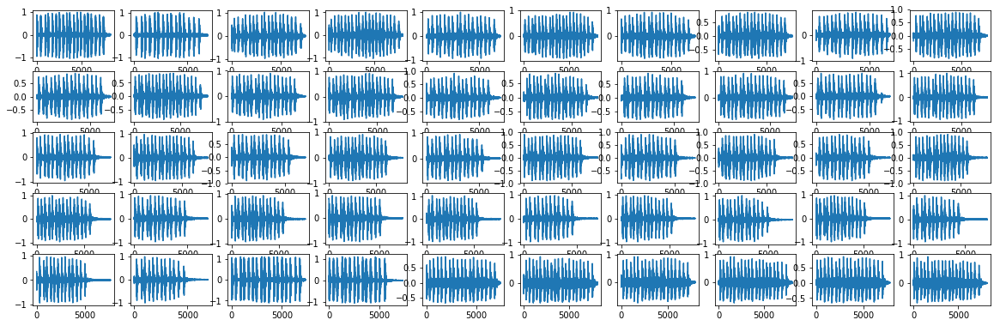

In [54]:
nrows = 5
ncols = 10
zoom = 2
fig, axs = plt.subplots(ncols=ncols, nrows = nrows,figsize = (ncols*zoom, nrows+zoom/1.5))
for i, syll in tqdm(enumerate(sylls), total = nrows*ncols):
    ax = axs.flatten()[i]
    ax.plot(syll)
    if i == nrows*ncols -1:
        break

In [55]:
syllable_df['audio'] = [i/np.max(i) for i in syllable_df.audio.values]

### Create spectrograms

In [56]:
from avgn.visualization.spectrogram import draw_spec_set
from avgn.signalprocessing.create_spectrogram_dataset import make_spec, mask_spec, log_resize_spec, pad_spectrogram

In [57]:
syllables_wav = syllable_df.audio.values
syllables_rate = syllable_df.rate.values

In [58]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    # create spectrograms
    syllables_spec = parallel(
        delayed(make_spec)(
            syllable,
            rate,
            hparams=dataset.hparams,
            mel_matrix=dataset.mel_matrix,
            use_mel=True,
            use_tensorflow=False,
        )
        for syllable, rate in tqdm(
            zip(syllables_wav, syllables_rate),
            total=len(syllables_rate),
            desc="getting syllable spectrograms",
            leave=False,
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0494s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1206s.) Setting batch_size=26.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 304 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 458 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 900 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 1394 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done 1888 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 2434 tasks      | elapsed:    1.5s
[Parallel

[Parallel(n_jobs=-1)]: Done 5975 out of 5975 | elapsed:    3.2s finished


### Rescale spectrogram
- using log rescaling

In [59]:
log_scaling_factor = 4

In [60]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:
    syllables_spec = parallel(
        delayed(log_resize_spec)(spec, scaling_factor=log_scaling_factor)
        for spec in tqdm(syllables_spec, desc="scaling spectrograms", leave=False)
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0057s.) Setting batch_size=70.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0057s.) Setting batch_size=4936.


[Parallel(n_jobs=-1)]: Done 5975 out of 5975 | elapsed:    3.3s finished


(25.0, 10) (320, 800) 25.0 32 800


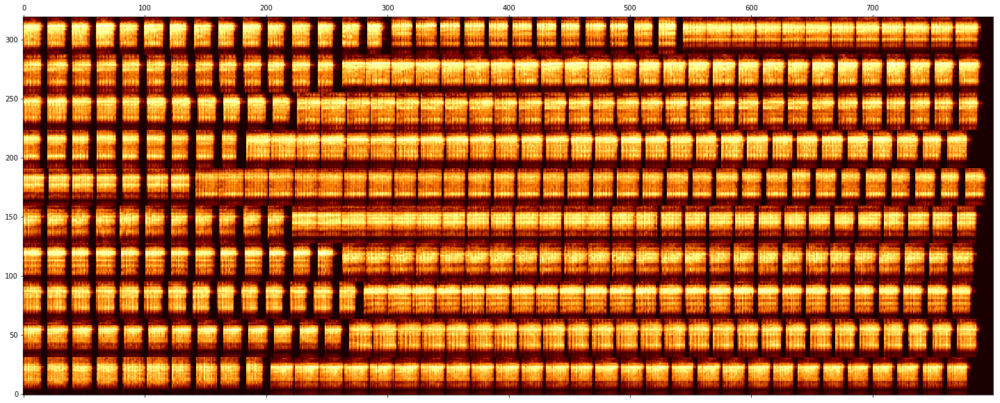

In [61]:
draw_spec_set(syllables_spec[5000:], zoom=1, maxrows=10, colsize=25)

### Pad spectrograms

In [62]:
syll_lens = [np.shape(i)[1] for i in syllables_spec]
pad_length = np.max(syll_lens)

In [63]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate
0,4.362,4.548,89460,0,Crex_crex_89460_short,"[0.10037928866469231, 0.1710392228558546, 0.16...",44100
1,6.162,6.319,89460,0,Crex_crex_89460_short,"[-0.015987384700499978, 0.0009605959436384295,...",44100
0,0.282,0.451,89490,0,Crex_crex_89490_short,"[0.0011467438984542739, -0.0008012976130073815...",44100


In [64]:
import seaborn as sns

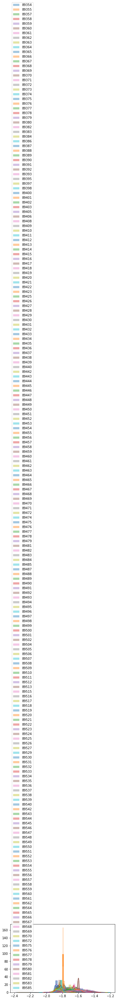

In [65]:
for indv in np.unique(syllable_df.indv):
    sns.distplot(np.log(syllable_df[syllable_df.indv==indv]["end_time"] - syllable_df[syllable_df.indv==indv]["start_time"]), label=indv)
plt.legend()

In [66]:
with Parallel(n_jobs=n_jobs, verbose=verbosity) as parallel:

    syllables_spec = parallel(
        delayed(pad_spectrogram)(spec, pad_length)
        for spec in tqdm(
            syllables_spec, desc="padding spectrograms", leave=False
        )
    )

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0400s.) Setting batch_size=10.
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0132s.) Setting batch_size=302.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1566s.) Setting batch_size=770.
[Parallel(n_jobs=-1)]: Done 1568 tasks      | elapsed:    0.4s


[Parallel(n_jobs=-1)]: Done 5975 out of 5975 | elapsed:    0.9s finished


In [67]:
def norm(x):
    return (x - np.min(x)) / (np.max(x) - np.min(x))

In [68]:
def remove_med(x):
    x[x<=np.median(x)] = 0
    return x

In [69]:
syllables_spec = [(norm(i)*255).astype('uint8') for i in tqdm(syllables_spec)]
syllables_spec = [remove_med(i) for i in tqdm(syllables_spec)]

(25.0, 10) (320, 800) 25.0 32 800


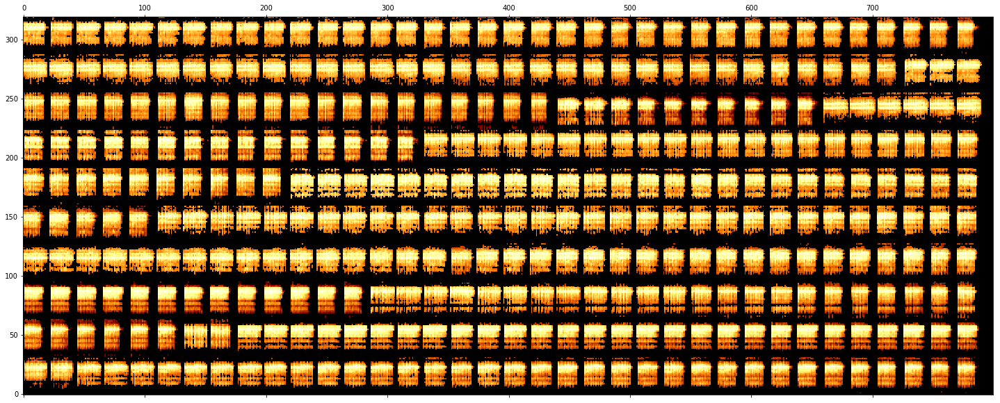

In [70]:
draw_spec_set(syllables_spec, zoom=1, maxrows=10, colsize=25)

In [71]:
np.shape(syllables_spec)

(5975, 32, 22)

In [72]:
syllable_df['spectrogram'] = syllables_spec

In [73]:
syllable_df[:3]

,start_time,end_time,indv,indvi,key,audio,rate,spectrogram
0,4.362,4.548,89460,0,Crex_crex_89460_short,"[0.10037928866469231, 0.1710392228558546, 0.16...",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
1,6.162,6.319,89460,0,Crex_crex_89460_short,"[-0.015987384700499978, 0.0009605959436384295,...",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."
0,0.282,0.451,89490,0,Crex_crex_89490_short,"[0.0011467438984542739, -0.0008012976130073815...",44100,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,..."


### view syllables per indv

In [74]:
syllable_df.indv.unique()

array(['89460', '89490', '89413', '89476', '89405', '89429', '89529',
       '89513', '89560', '89505', '89576', '89371', '89518', '89367',
       '89397', '89522', '89551', '89534', '89547', '89451', '89422',
       '89447', '89434', '89418', '89390', '89360', '89386', '89509',
       '89376', '89540', '89533', '89556', '89525', '89433', '89440',
       '89425', '89456', '89409', '89402', '89481', '89471', '89414',
       '89497', '89467', '89438', '89538', '89581', '89502', '89567',
       '89354', '89558', '89378', '89507', '89388', '89511', '89562',
       '89474', '89484', '89462', '89411', '89492', '89458', '89445',
       '89436', '89453', '89420', '89469', '89499', '89365', '89395',
       '89569', '89373', '89383', '89536', '89545', '89520', '89553',
       '89427', '89454', '89431', '89442', '89488', '89478', '89578',
       '89384', '89374', '89392', '89362', '89554', '89358', '89527',
       '89542', '89531', '89549', '89565', '89369', '89516', '89500',
       '89583', '894

89354 41
(50.0, 4) (64, 800) 25.0 32 800


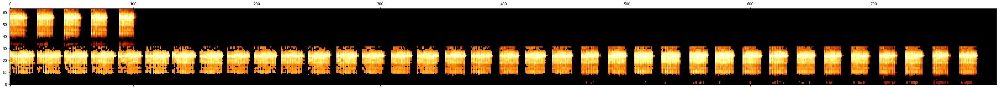

89355 21
(50.0, 2) (32, 800) 25.0 32 800


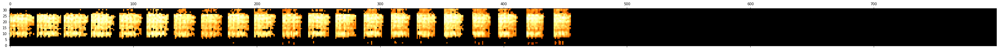

89357 41
(50.0, 4) (64, 800) 25.0 32 800


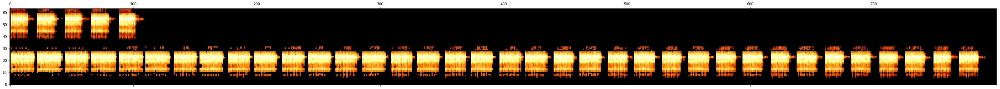

89358 41
(50.0, 4) (64, 800) 25.0 32 800


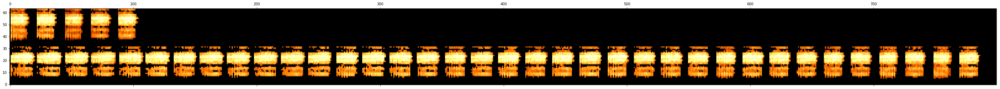

89359 41
(50.0, 4) (64, 800) 25.0 32 800


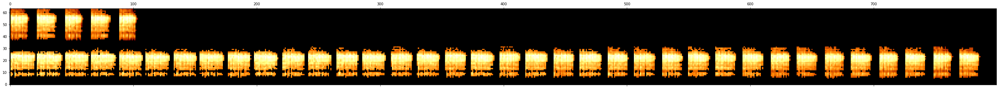

89360 39
(50.0, 4) (64, 800) 25.0 32 800


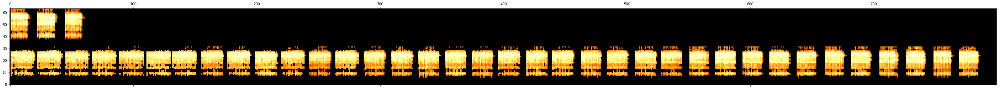

89361 41
(50.0, 4) (64, 800) 25.0 32 800


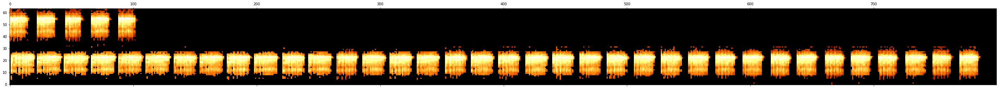

89362 41
(50.0, 4) (64, 800) 25.0 32 800


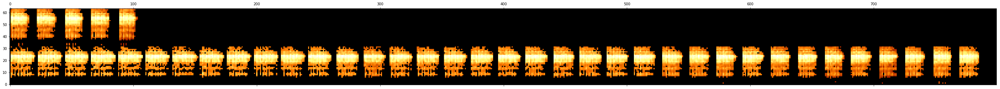

89363 3
(50.0, 2) (32, 800) 25.0 32 800


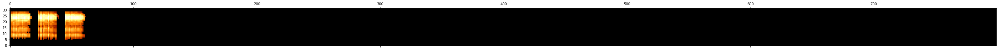

89364 41
(50.0, 4) (64, 800) 25.0 32 800


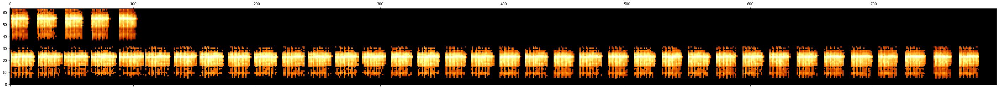

89365 13
(50.0, 2) (32, 800) 25.0 32 800


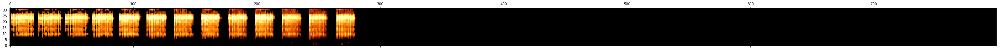

89366 40
(50.0, 4) (64, 800) 25.0 32 800


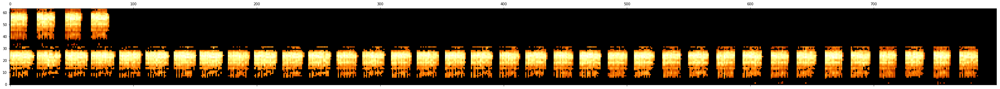

89367 41
(50.0, 4) (64, 800) 25.0 32 800


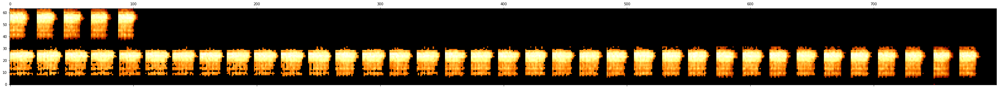

89368 27
(50.0, 2) (32, 800) 25.0 32 800


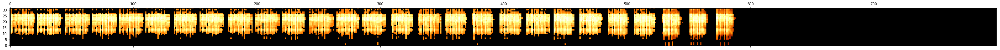

89369 35
(50.0, 2) (32, 800) 25.0 32 800


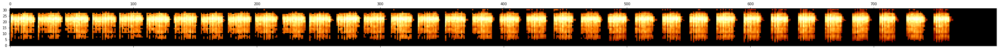

89370 41
(50.0, 4) (64, 800) 25.0 32 800


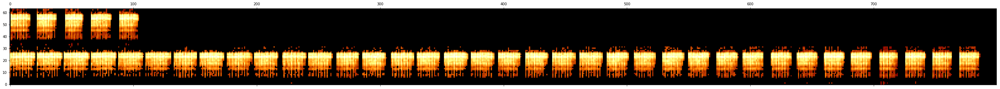

89371 41
(50.0, 4) (64, 800) 25.0 32 800


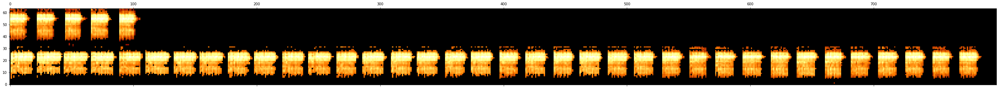

89372 3
(50.0, 2) (32, 800) 25.0 32 800


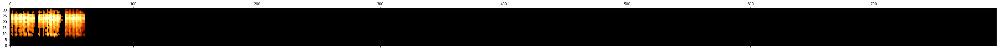

89373 1
(50.0, 2) (32, 800) 25.0 32 800


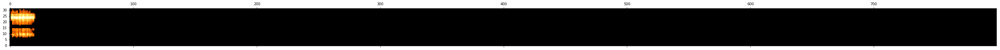

89374 41
(50.0, 4) (64, 800) 25.0 32 800


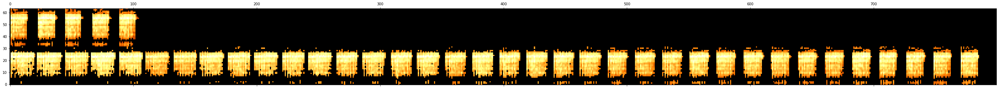

89375 41
(50.0, 4) (64, 800) 25.0 32 800


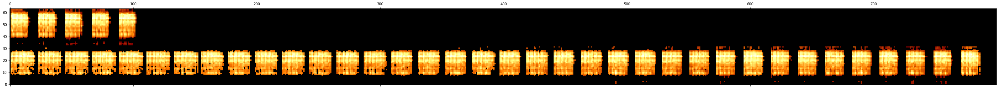

89376 29
(50.0, 2) (32, 800) 25.0 32 800


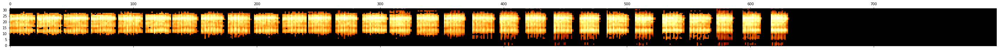

89377 4
(50.0, 2) (32, 800) 25.0 32 800


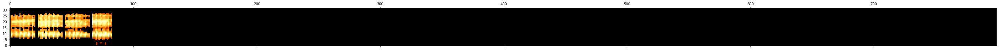

89378 19
(50.0, 2) (32, 800) 25.0 32 800


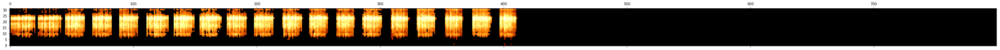

89379 37
(50.0, 4) (64, 800) 25.0 32 800


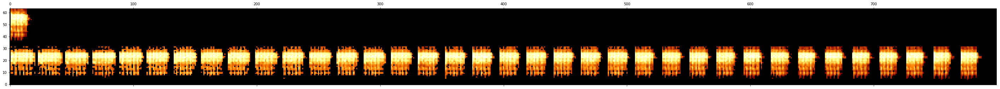

89380 9
(50.0, 2) (32, 800) 25.0 32 800


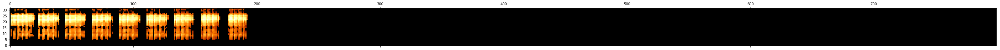

89382 41
(50.0, 4) (64, 800) 25.0 32 800


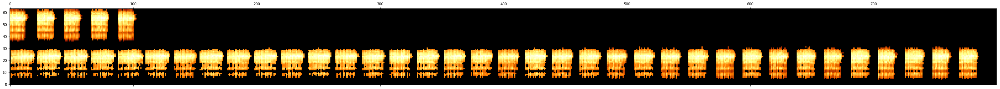

89383 41
(50.0, 4) (64, 800) 25.0 32 800


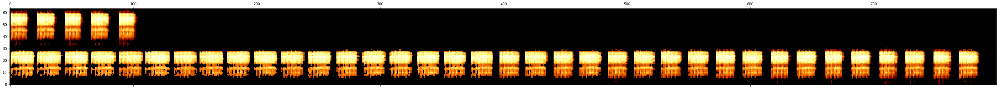

89384 39
(50.0, 4) (64, 800) 25.0 32 800


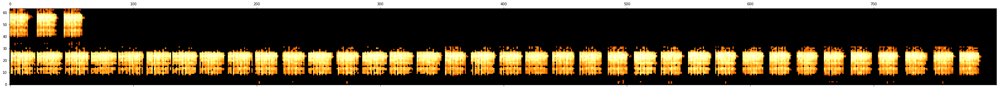

89386 36
(50.0, 2) (32, 800) 25.0 32 800


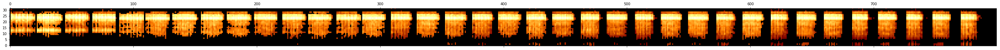

89387 5
(50.0, 2) (32, 800) 25.0 32 800


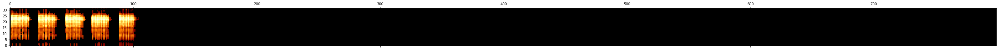

89388 41
(50.0, 4) (64, 800) 25.0 32 800


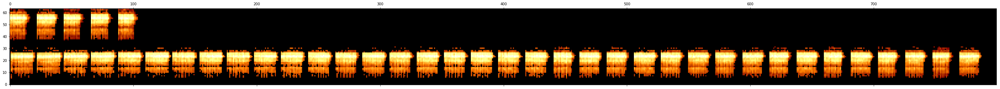

89389 38
(50.0, 4) (64, 800) 25.0 32 800


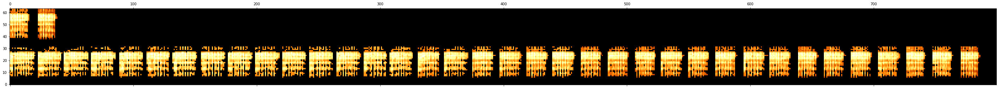

89390 22
(50.0, 2) (32, 800) 25.0 32 800


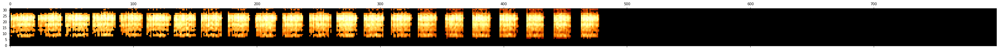

89391 13
(50.0, 2) (32, 800) 25.0 32 800


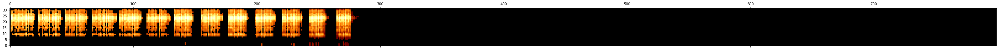

89392 3
(50.0, 2) (32, 800) 25.0 32 800


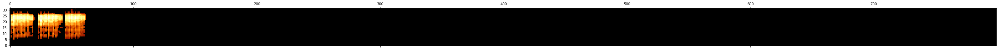

89393 1
(50.0, 2) (32, 800) 25.0 32 800


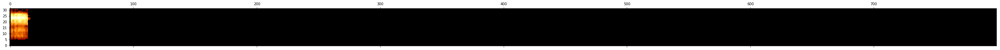

89395 32
(50.0, 2) (32, 800) 25.0 32 800


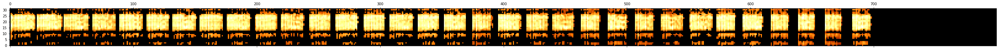

89397 26
(50.0, 2) (32, 800) 25.0 32 800


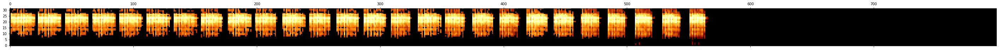

89398 41
(50.0, 4) (64, 800) 25.0 32 800


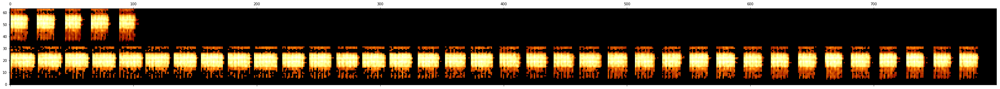

89400 1
(50.0, 2) (32, 800) 25.0 32 800


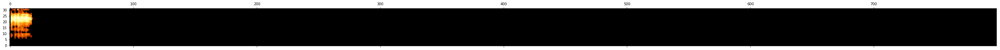

89401 29
(50.0, 2) (32, 800) 25.0 32 800


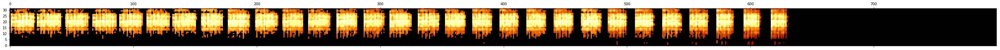

89402 41
(50.0, 4) (64, 800) 25.0 32 800


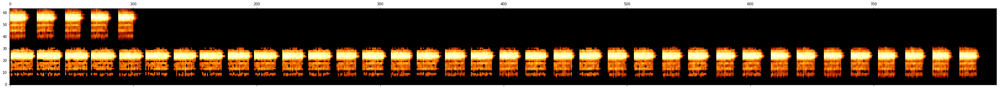

89403 40
(50.0, 4) (64, 800) 25.0 32 800


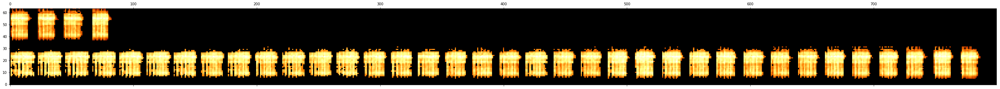

89405 23
(50.0, 2) (32, 800) 25.0 32 800


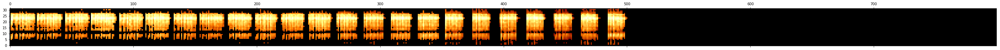

89406 28
(50.0, 2) (32, 800) 25.0 32 800


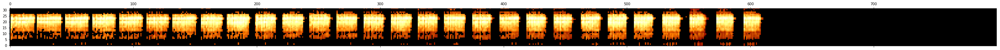

89408 19
(50.0, 2) (32, 800) 25.0 32 800


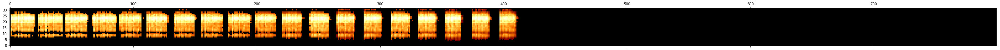

89409 1
(50.0, 2) (32, 800) 25.0 32 800


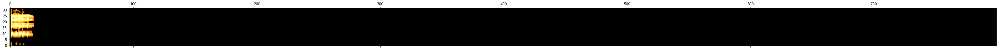

89410 1
(50.0, 2) (32, 800) 25.0 32 800


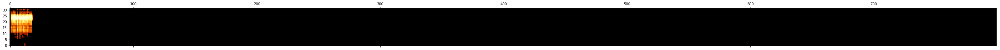

89411 38
(50.0, 4) (64, 800) 25.0 32 800


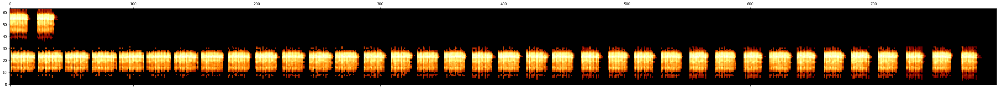

89412 9
(50.0, 2) (32, 800) 25.0 32 800


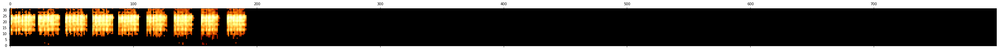

89413 2
(50.0, 2) (32, 800) 25.0 32 800


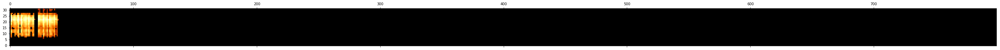

89414 5
(50.0, 2) (32, 800) 25.0 32 800


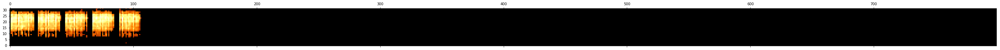

89415 37
(50.0, 4) (64, 800) 25.0 32 800


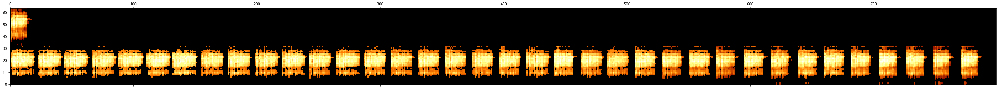

89416 41
(50.0, 4) (64, 800) 25.0 32 800


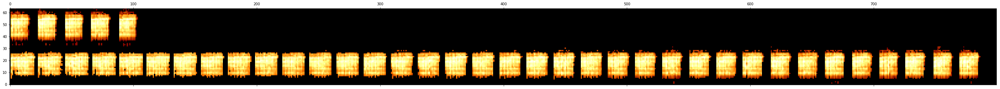

89417 17
(50.0, 2) (32, 800) 25.0 32 800


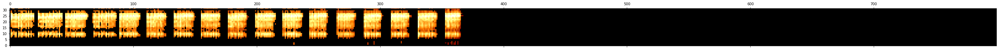

89418 12
(50.0, 2) (32, 800) 25.0 32 800


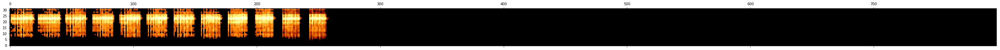

89419 40
(50.0, 4) (64, 800) 25.0 32 800


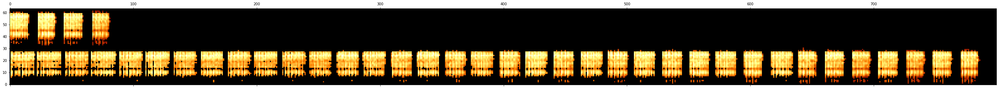

89420 15
(50.0, 2) (32, 800) 25.0 32 800


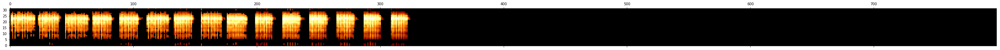

89421 35
(50.0, 2) (32, 800) 25.0 32 800


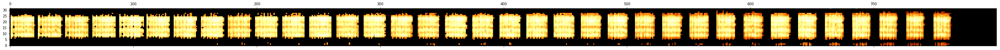

89422 40
(50.0, 4) (64, 800) 25.0 32 800


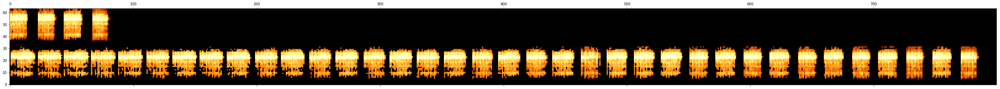

89423 41
(50.0, 4) (64, 800) 25.0 32 800


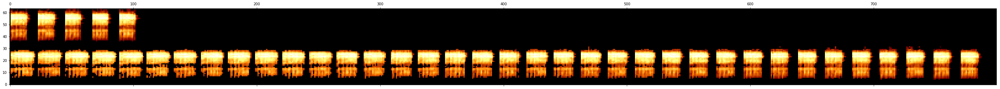

89425 19
(50.0, 2) (32, 800) 25.0 32 800


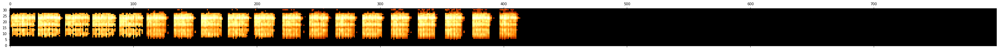

89426 40
(50.0, 4) (64, 800) 25.0 32 800


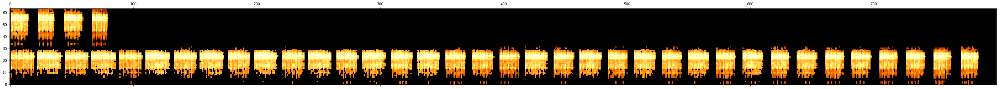

89427 41
(50.0, 4) (64, 800) 25.0 32 800


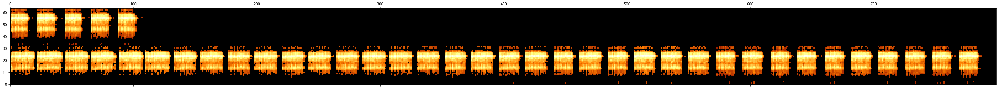

89428 39
(50.0, 4) (64, 800) 25.0 32 800


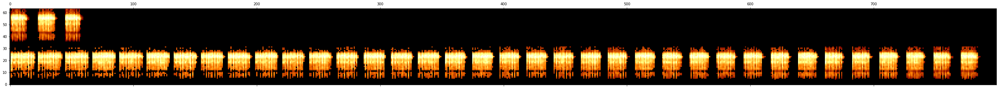

89429 41
(50.0, 4) (64, 800) 25.0 32 800


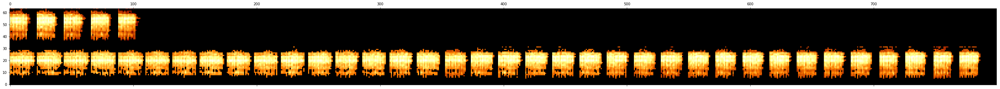

89430 40
(50.0, 4) (64, 800) 25.0 32 800


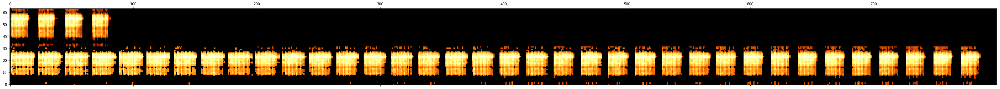

89431 35
(50.0, 2) (32, 800) 25.0 32 800


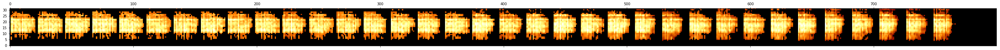

89432 41
(50.0, 4) (64, 800) 25.0 32 800


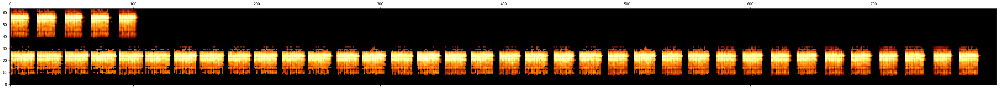

89433 35
(50.0, 2) (32, 800) 25.0 32 800


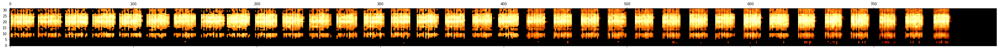

89434 22
(50.0, 2) (32, 800) 25.0 32 800


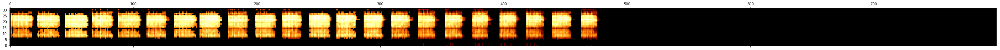

89435 41
(50.0, 4) (64, 800) 25.0 32 800


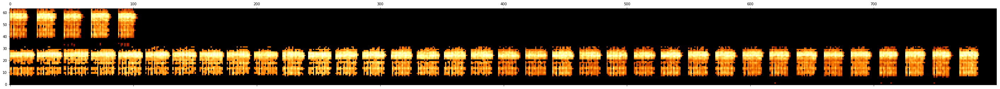

89436 41
(50.0, 4) (64, 800) 25.0 32 800


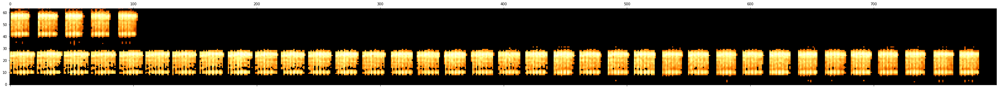

89437 41
(50.0, 4) (64, 800) 25.0 32 800


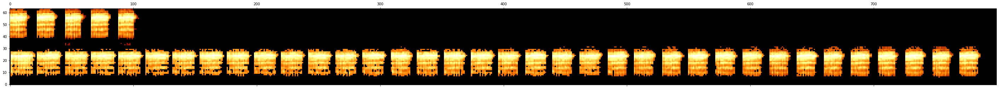

89438 12
(50.0, 2) (32, 800) 25.0 32 800


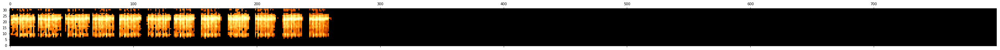

89439 41
(50.0, 4) (64, 800) 25.0 32 800


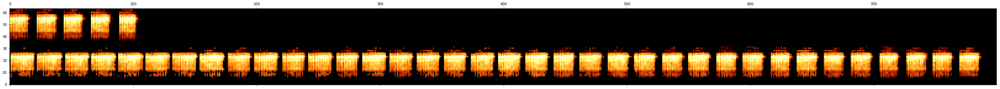

89440 31
(50.0, 2) (32, 800) 25.0 32 800


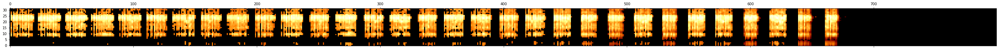

89442 26
(50.0, 2) (32, 800) 25.0 32 800


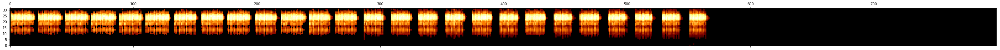

89443 41
(50.0, 4) (64, 800) 25.0 32 800


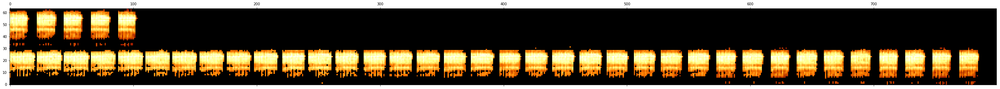

89444 1
(50.0, 2) (32, 800) 25.0 32 800


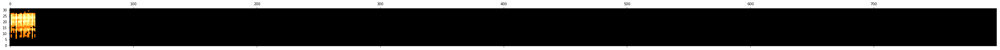

89445 29
(50.0, 2) (32, 800) 25.0 32 800


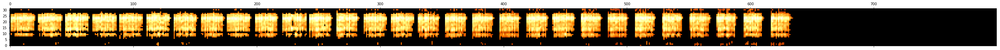

89446 18
(50.0, 2) (32, 800) 25.0 32 800


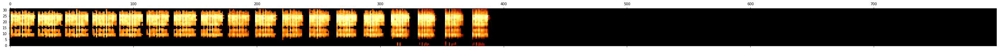

89447 30
(50.0, 2) (32, 800) 25.0 32 800


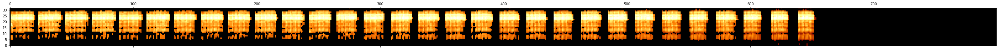

89448 32
(50.0, 2) (32, 800) 25.0 32 800


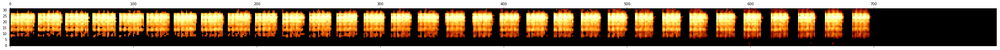

89449 38
(50.0, 4) (64, 800) 25.0 32 800


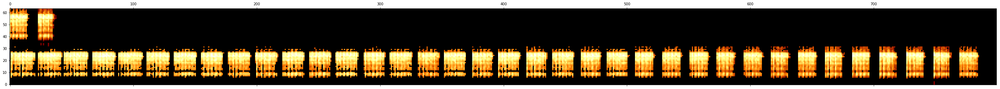

89450 39
(50.0, 4) (64, 800) 25.0 32 800


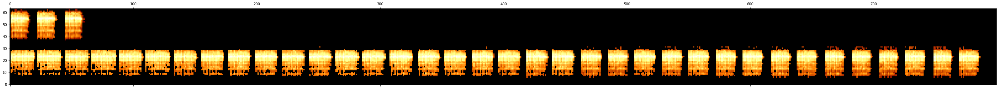

89451 20
(50.0, 2) (32, 800) 25.0 32 800


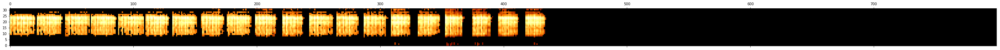

89452 34
(50.0, 2) (32, 800) 25.0 32 800


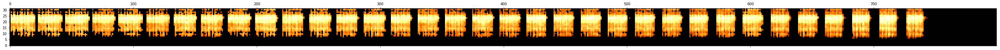

89453 41
(50.0, 4) (64, 800) 25.0 32 800


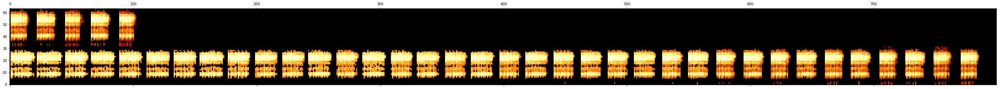

89454 41
(50.0, 4) (64, 800) 25.0 32 800


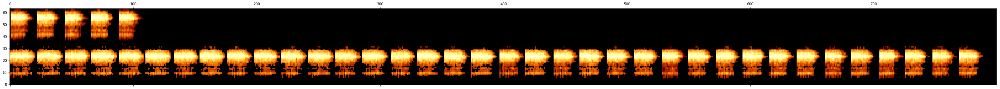

89455 1
(50.0, 2) (32, 800) 25.0 32 800


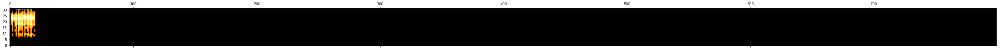

89456 39
(50.0, 4) (64, 800) 25.0 32 800


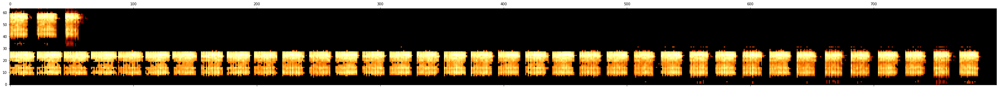

89457 37
(50.0, 4) (64, 800) 25.0 32 800


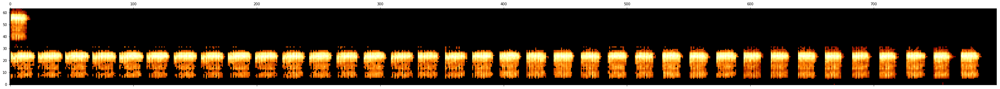

89458 39
(50.0, 4) (64, 800) 25.0 32 800


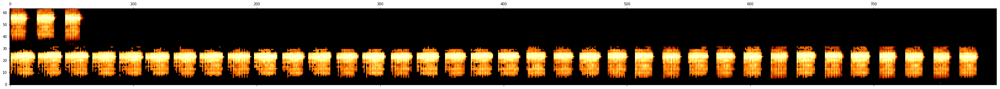

89459 40
(50.0, 4) (64, 800) 25.0 32 800


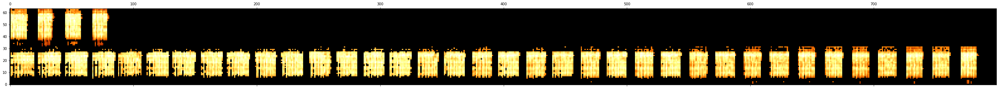

89460 2
(50.0, 2) (32, 800) 25.0 32 800


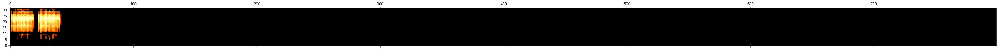

89461 24
(50.0, 2) (32, 800) 25.0 32 800


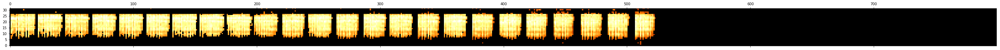

89462 41
(50.0, 4) (64, 800) 25.0 32 800


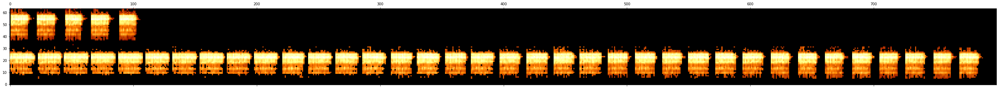

89463 1
(50.0, 2) (32, 800) 25.0 32 800


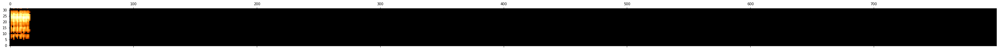

89464 41
(50.0, 4) (64, 800) 25.0 32 800


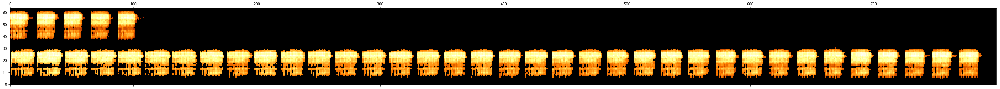

89465 41
(50.0, 4) (64, 800) 25.0 32 800


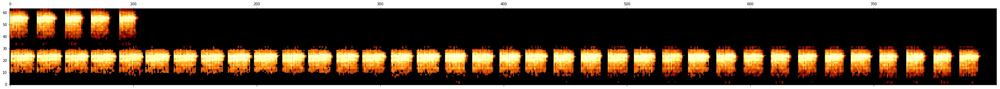

89466 41
(50.0, 4) (64, 800) 25.0 32 800


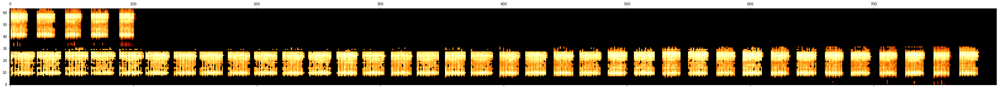

89467 2
(50.0, 2) (32, 800) 25.0 32 800


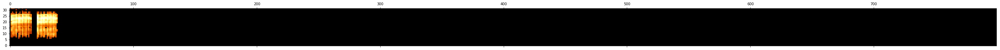

89468 13
(50.0, 2) (32, 800) 25.0 32 800


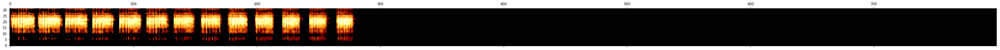

89469 2
(50.0, 2) (32, 800) 25.0 32 800


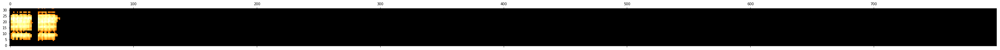

89470 38
(50.0, 4) (64, 800) 25.0 32 800


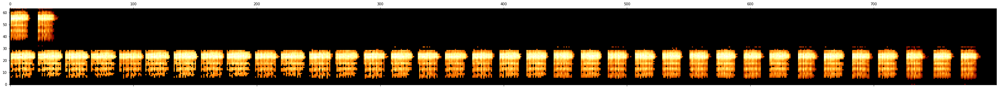

89471 33
(50.0, 2) (32, 800) 25.0 32 800


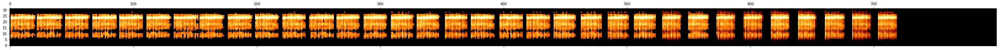

89472 41
(50.0, 4) (64, 800) 25.0 32 800


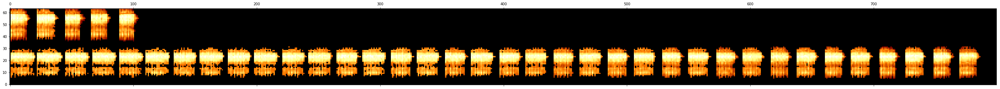

89474 1
(50.0, 2) (32, 800) 25.0 32 800


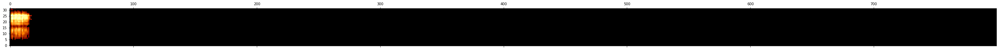

89475 2
(50.0, 2) (32, 800) 25.0 32 800


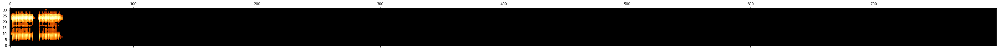

89476 41
(50.0, 4) (64, 800) 25.0 32 800


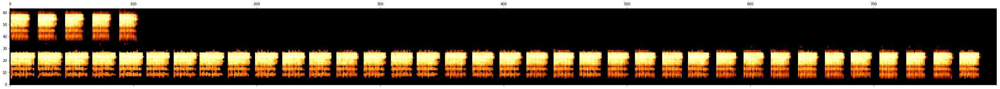

89477 27
(50.0, 2) (32, 800) 25.0 32 800


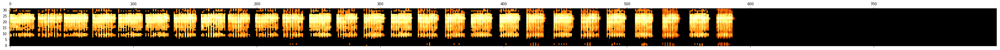

89478 2
(50.0, 2) (32, 800) 25.0 32 800


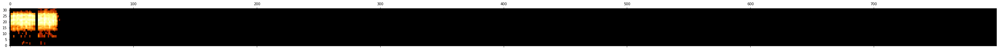

89479 41
(50.0, 4) (64, 800) 25.0 32 800


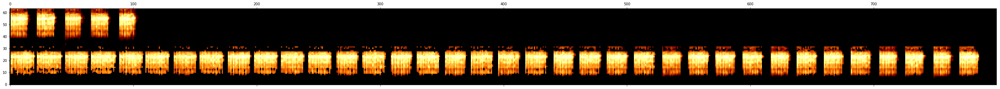

89481 23
(50.0, 2) (32, 800) 25.0 32 800


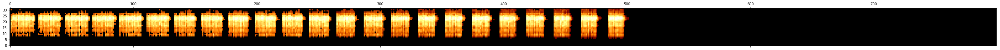

89482 13
(50.0, 2) (32, 800) 25.0 32 800


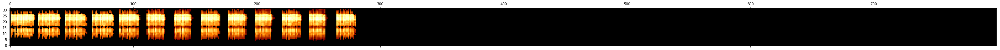

89483 4
(50.0, 2) (32, 800) 25.0 32 800


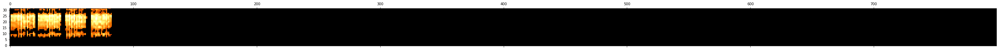

89484 1
(50.0, 2) (32, 800) 25.0 32 800


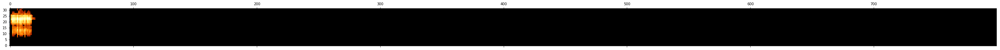

89485 39
(50.0, 4) (64, 800) 25.0 32 800


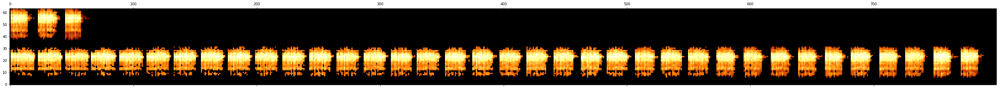

89487 7
(50.0, 2) (32, 800) 25.0 32 800


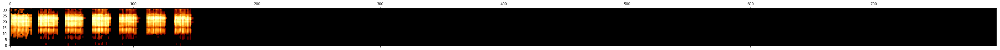

89488 40
(50.0, 4) (64, 800) 25.0 32 800


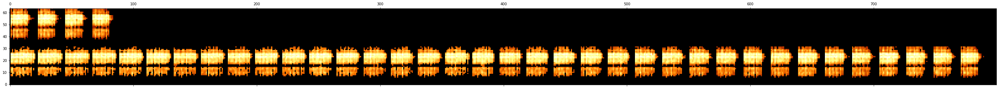

89489 41
(50.0, 4) (64, 800) 25.0 32 800


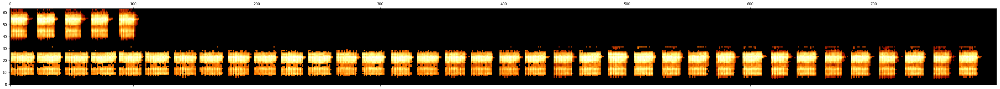

89490 40
(50.0, 4) (64, 800) 25.0 32 800


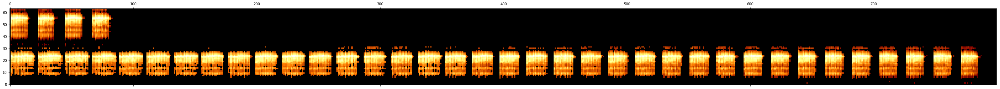

89491 36
(50.0, 2) (32, 800) 25.0 32 800


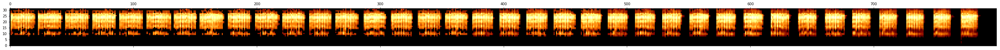

89492 31
(50.0, 2) (32, 800) 25.0 32 800


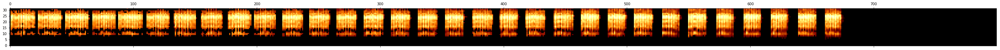

89493 28
(50.0, 2) (32, 800) 25.0 32 800


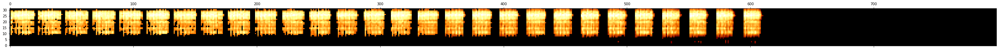

89494 30
(50.0, 2) (32, 800) 25.0 32 800


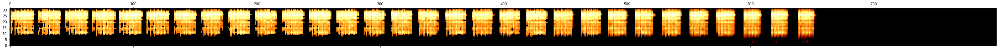

89495 40
(50.0, 4) (64, 800) 25.0 32 800


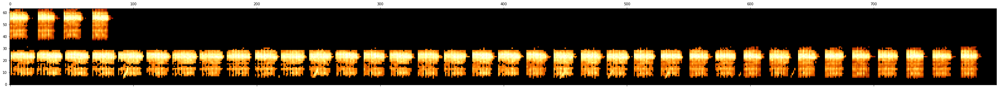

89496 35
(50.0, 2) (32, 800) 25.0 32 800


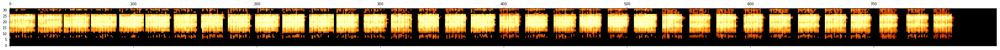

89497 41
(50.0, 4) (64, 800) 25.0 32 800


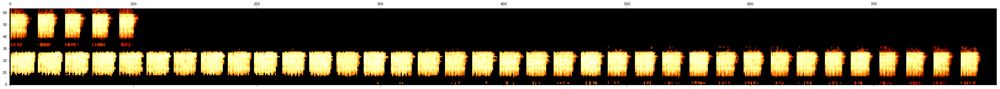

89498 2
(50.0, 2) (32, 800) 25.0 32 800


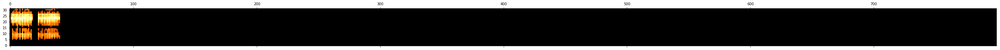

89499 16
(50.0, 2) (32, 800) 25.0 32 800


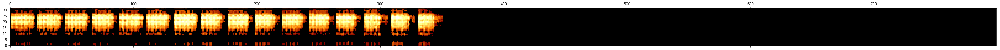

89500 41
(50.0, 4) (64, 800) 25.0 32 800


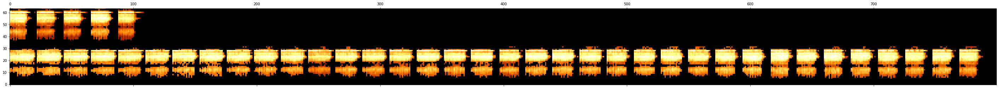

89501 10
(50.0, 2) (32, 800) 25.0 32 800


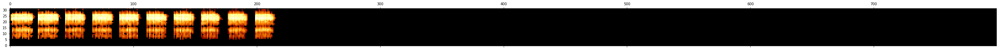

89502 41
(50.0, 4) (64, 800) 25.0 32 800


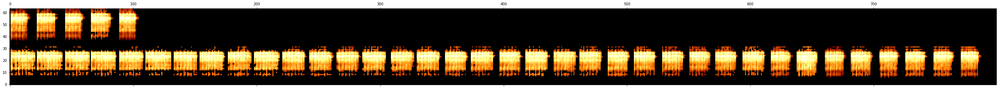

89504 41
(50.0, 4) (64, 800) 25.0 32 800


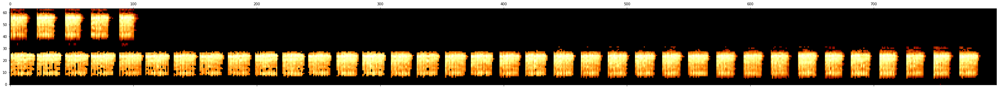

89505 10
(50.0, 2) (32, 800) 25.0 32 800


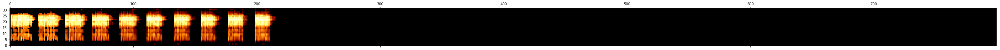

89506 41
(50.0, 4) (64, 800) 25.0 32 800


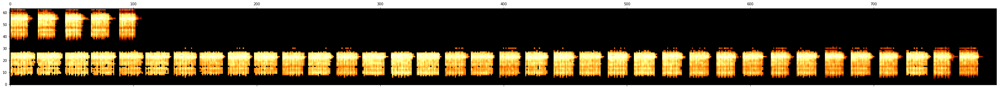

89507 40
(50.0, 4) (64, 800) 25.0 32 800


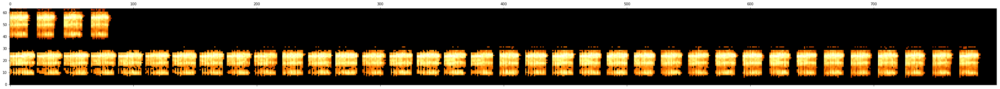

89508 40
(50.0, 4) (64, 800) 25.0 32 800


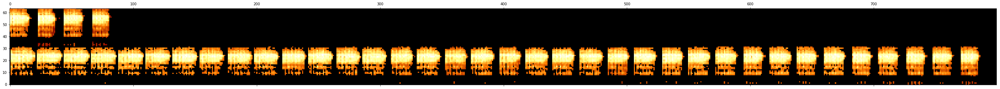

89509 21
(50.0, 2) (32, 800) 25.0 32 800


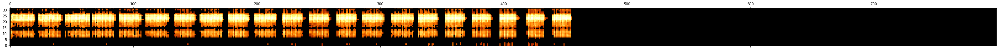

89510 41
(50.0, 4) (64, 800) 25.0 32 800


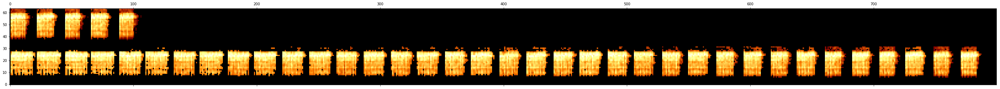

89511 41
(50.0, 4) (64, 800) 25.0 32 800


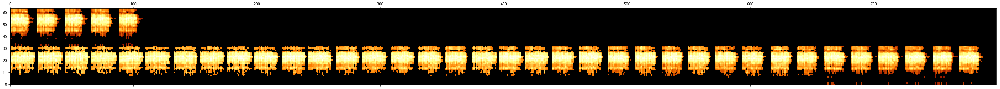

89512 40
(50.0, 4) (64, 800) 25.0 32 800


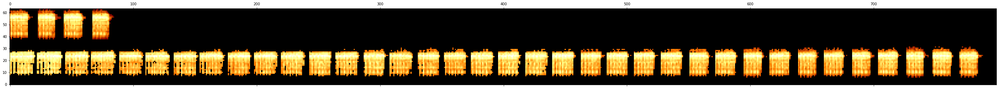

89513 41
(50.0, 4) (64, 800) 25.0 32 800


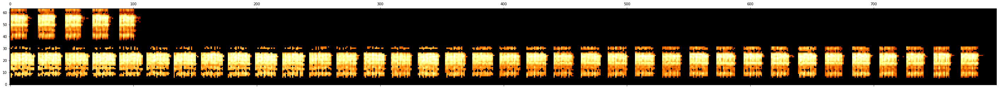

89515 41
(50.0, 4) (64, 800) 25.0 32 800


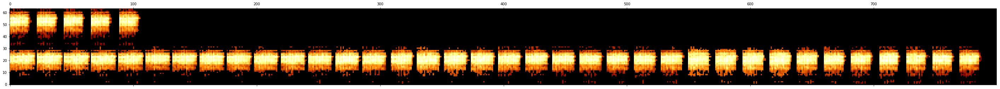

89516 41
(50.0, 4) (64, 800) 25.0 32 800


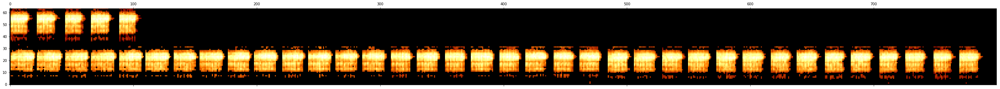

89517 40
(50.0, 4) (64, 800) 25.0 32 800


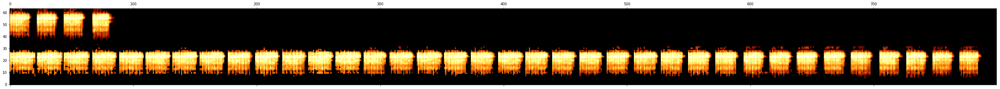

89518 16
(50.0, 2) (32, 800) 25.0 32 800


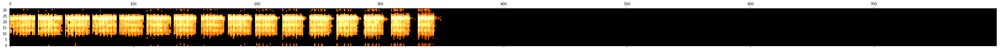

89519 41
(50.0, 4) (64, 800) 25.0 32 800


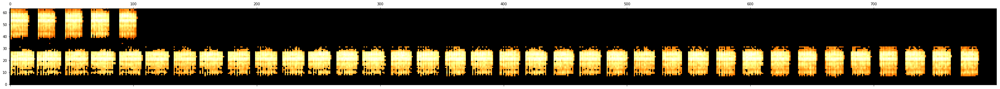

89520 1
(50.0, 2) (32, 800) 25.0 32 800


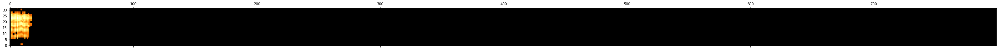

89521 41
(50.0, 4) (64, 800) 25.0 32 800


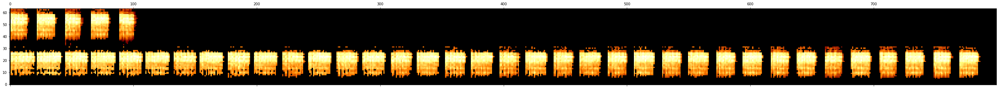

89522 39
(50.0, 4) (64, 800) 25.0 32 800


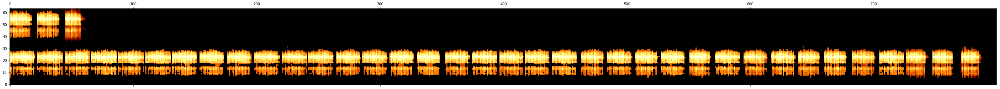

89523 41
(50.0, 4) (64, 800) 25.0 32 800


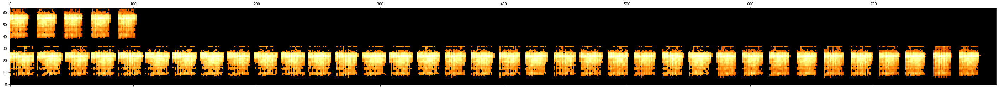

89524 41
(50.0, 4) (64, 800) 25.0 32 800


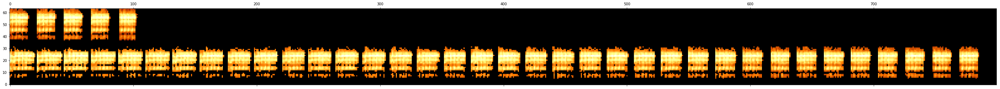

89525 41
(50.0, 4) (64, 800) 25.0 32 800


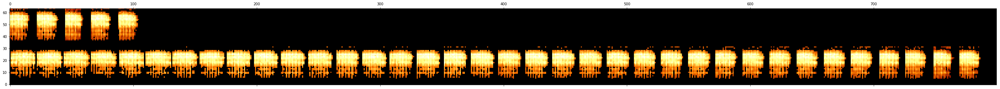

89526 41
(50.0, 4) (64, 800) 25.0 32 800


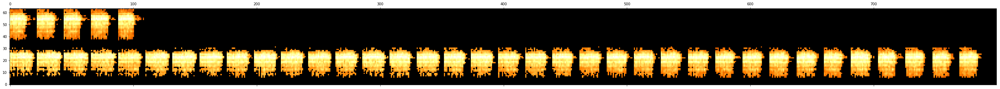

89527 41
(50.0, 4) (64, 800) 25.0 32 800


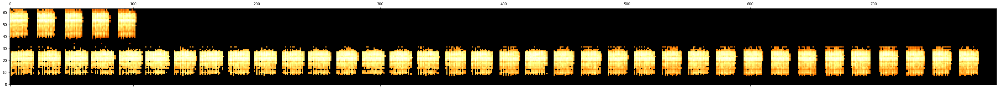

89529 41
(50.0, 4) (64, 800) 25.0 32 800


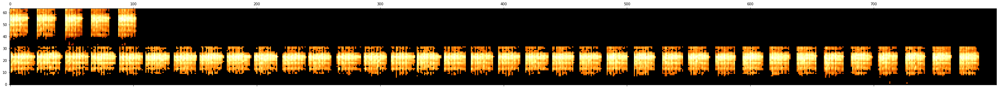

89530 41
(50.0, 4) (64, 800) 25.0 32 800


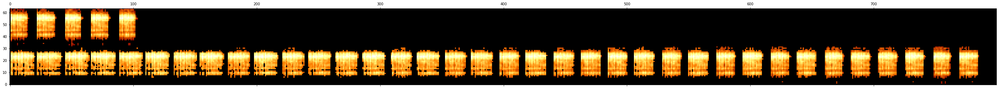

89531 41
(50.0, 4) (64, 800) 25.0 32 800


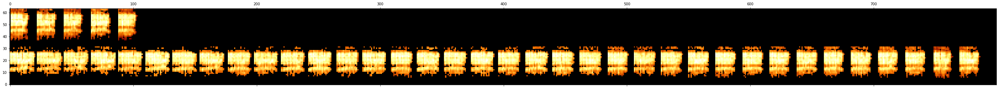

89532 41
(50.0, 4) (64, 800) 25.0 32 800


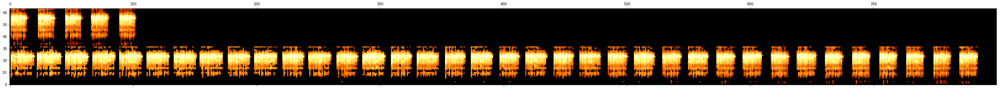

89533 40
(50.0, 4) (64, 800) 25.0 32 800


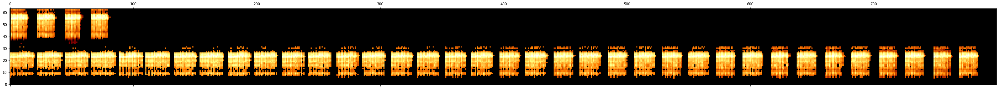

89534 41
(50.0, 4) (64, 800) 25.0 32 800


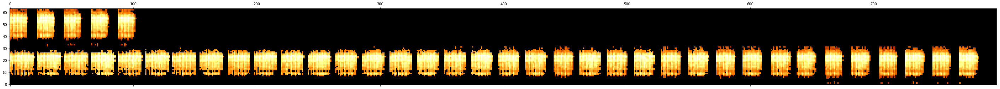

89535 8
(50.0, 2) (32, 800) 25.0 32 800


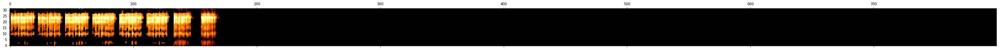

89536 39
(50.0, 4) (64, 800) 25.0 32 800


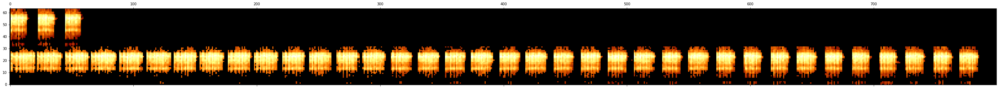

89537 38
(50.0, 4) (64, 800) 25.0 32 800


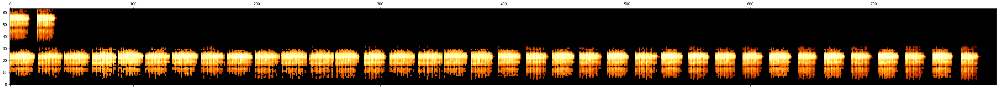

89538 31
(50.0, 2) (32, 800) 25.0 32 800


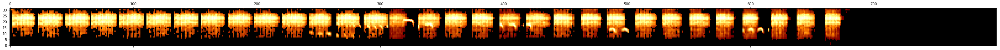

89539 22
(50.0, 2) (32, 800) 25.0 32 800


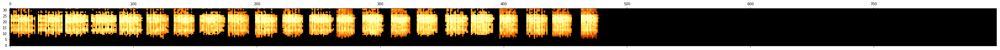

89540 40
(50.0, 4) (64, 800) 25.0 32 800


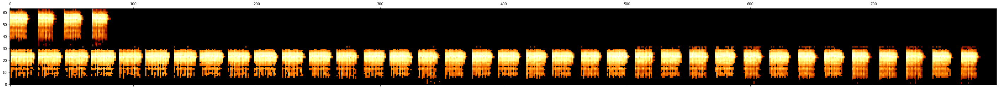

89542 23
(50.0, 2) (32, 800) 25.0 32 800


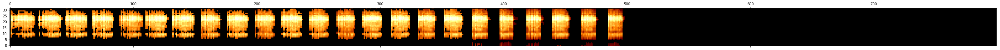

89543 40
(50.0, 4) (64, 800) 25.0 32 800


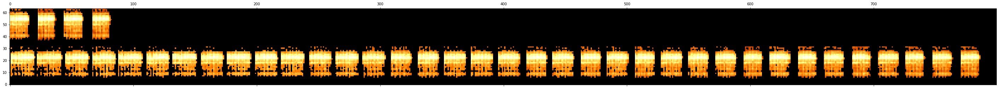

89544 41
(50.0, 4) (64, 800) 25.0 32 800


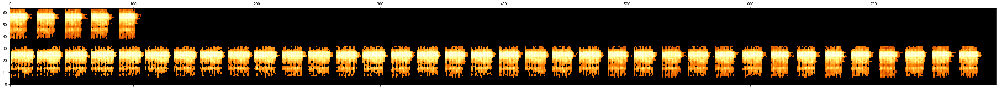

89545 41
(50.0, 4) (64, 800) 25.0 32 800


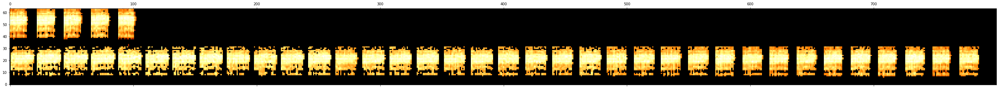

89546 16
(50.0, 2) (32, 800) 25.0 32 800


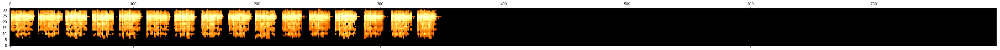

89547 14
(50.0, 2) (32, 800) 25.0 32 800


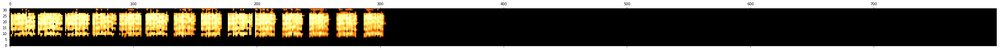

89548 41
(50.0, 4) (64, 800) 25.0 32 800


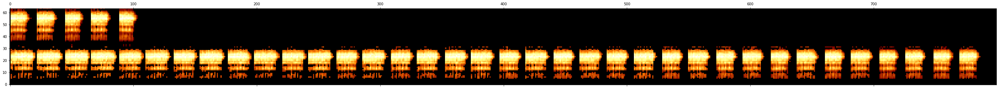

89549 28
(50.0, 2) (32, 800) 25.0 32 800


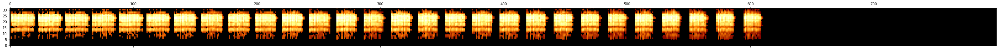

89550 41
(50.0, 4) (64, 800) 25.0 32 800


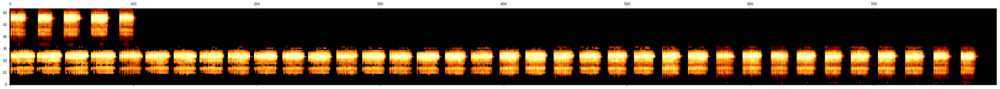

89551 1
(50.0, 2) (32, 800) 25.0 32 800


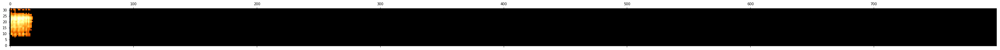

89552 28
(50.0, 2) (32, 800) 25.0 32 800


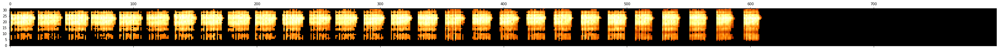

89553 14
(50.0, 2) (32, 800) 25.0 32 800


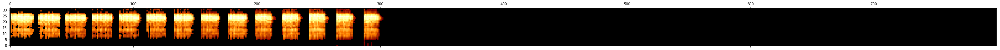

89554 3
(50.0, 2) (32, 800) 25.0 32 800


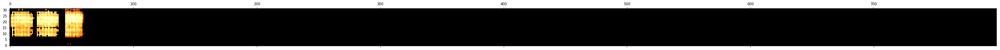

89555 20
(50.0, 2) (32, 800) 25.0 32 800


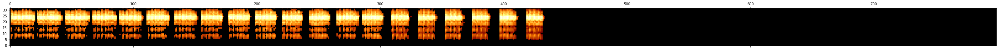

89556 8
(50.0, 2) (32, 800) 25.0 32 800


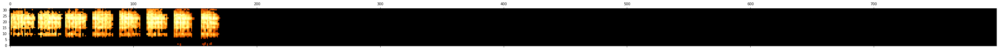

89557 25
(50.0, 2) (32, 800) 25.0 32 800


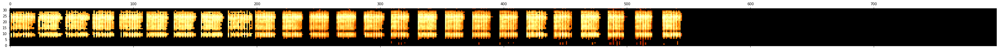

89558 2
(50.0, 2) (32, 800) 25.0 32 800


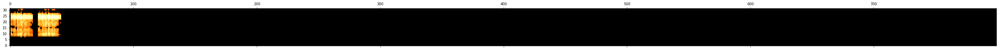

89559 26
(50.0, 2) (32, 800) 25.0 32 800


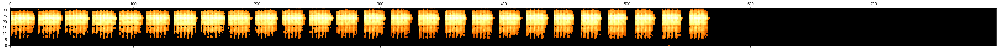

89560 41
(50.0, 4) (64, 800) 25.0 32 800


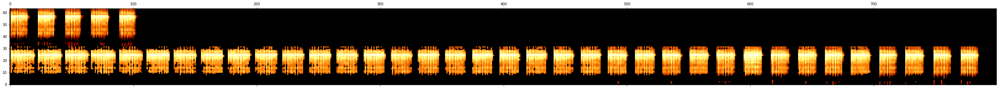

89561 41
(50.0, 4) (64, 800) 25.0 32 800


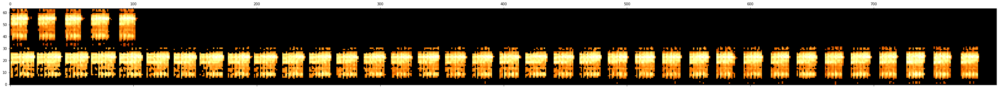

89562 41
(50.0, 4) (64, 800) 25.0 32 800


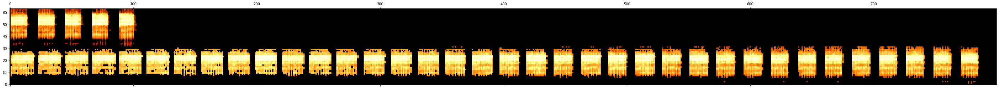

89564 3
(50.0, 2) (32, 800) 25.0 32 800


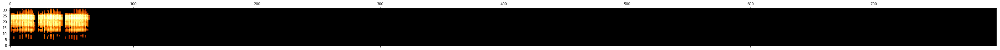

89565 20
(50.0, 2) (32, 800) 25.0 32 800


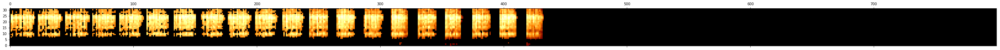

89566 38
(50.0, 4) (64, 800) 25.0 32 800


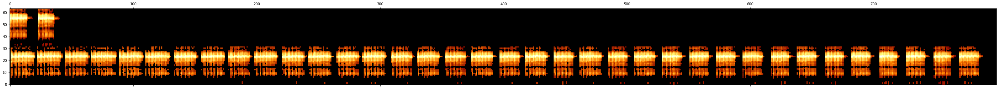

89567 41
(50.0, 4) (64, 800) 25.0 32 800


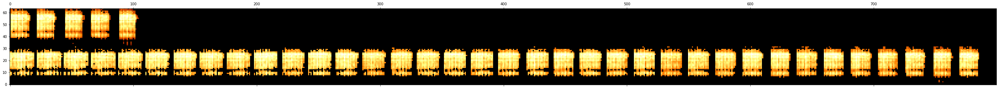

89568 37
(50.0, 4) (64, 800) 25.0 32 800


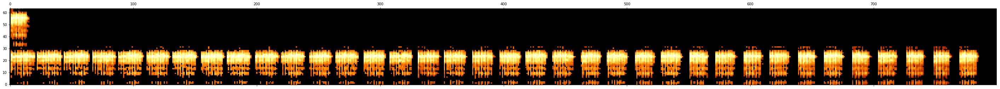

89569 41
(50.0, 4) (64, 800) 25.0 32 800


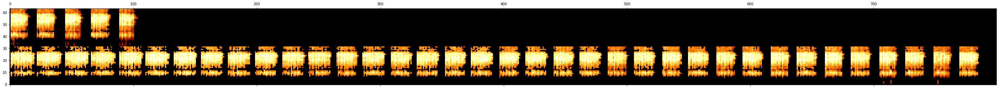

89570 13
(50.0, 2) (32, 800) 25.0 32 800


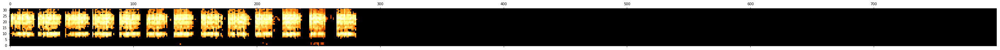

89572 35
(50.0, 2) (32, 800) 25.0 32 800


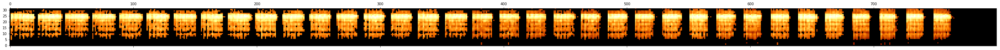

89575 1
(50.0, 2) (32, 800) 25.0 32 800


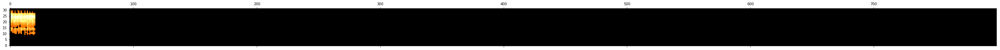

89576 39
(50.0, 4) (64, 800) 25.0 32 800


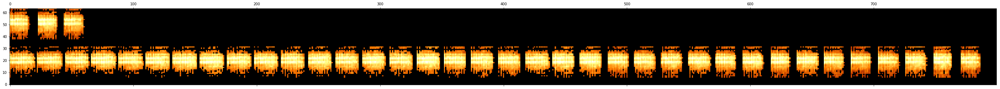

89577 12
(50.0, 2) (32, 800) 25.0 32 800


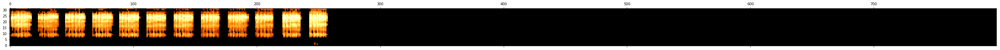

89578 32
(50.0, 2) (32, 800) 25.0 32 800


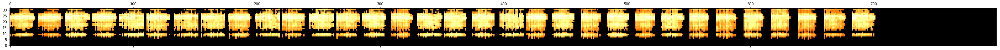

89579 22
(50.0, 2) (32, 800) 25.0 32 800


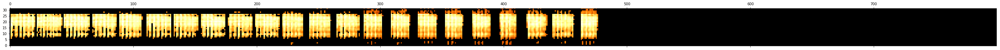

89580 1
(50.0, 2) (32, 800) 25.0 32 800


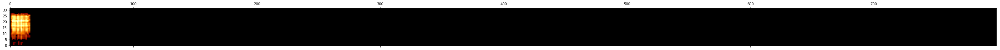

89581 41
(50.0, 4) (64, 800) 25.0 32 800


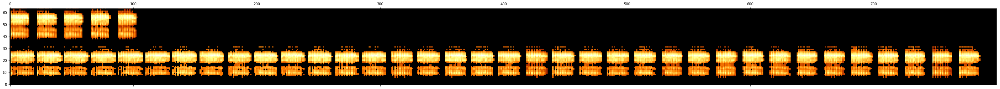

89582 41
(50.0, 4) (64, 800) 25.0 32 800


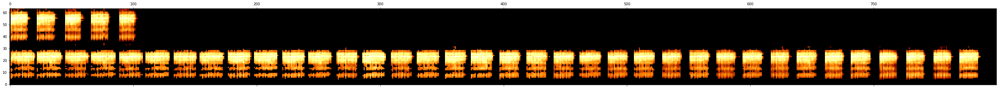

89583 8
(50.0, 2) (32, 800) 25.0 32 800


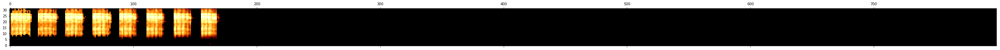

89585 6
(50.0, 2) (32, 800) 25.0 32 800


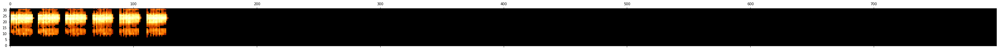

In [75]:
for indv in np.sort(syllable_df.indv.unique()):
    print(indv, np.sum(syllable_df.indv == indv))
    specs = np.array([i/np.max(i) for i in syllable_df[syllable_df.indv == indv].spectrogram.values])
    specs[specs<0] = 0
    draw_spec_set(specs, zoom=2,
                  maxrows=16, 
                  colsize=25)

### save dataset

In [76]:
save_loc = DATA_DIR / 'syllable_dfs' / DATASET_ID / 'corncrake.pickle'
ensure_dir(save_loc)
syllable_df.to_pickle(save_loc)